<a href="https://colab.research.google.com/github/AVI18794/GROUPASSIGNMENTUHG/blob/main/Assignment_Spotify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Spotify uses a series of different features to classify the tracks. 

- Acousticness: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 - track is acoustic.
-	Danceability: how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

- Energy: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. 
- Instrumentalness: Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content.

- Liveness: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live.
- Loudness: the overall loudness of a track in decibels (dB). Values typically range between -60 and 0 db.
- Speechiness: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audiobook, poetry), the closer to 1.0 the attribute value. 
- Valence: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).
- Tempo: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, the tempo is the speed or pace of a given piece and derives directly from the average beat duration.


LIFECYCLE OF THE PROJECT

- data analysis
- EDA
- Feature Engineering
- Model Building

In [ ]:
!pip install sweetviz


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline 

import sweetviz as sw

from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing

from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn import metrics

from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor

from sklearn.cluster import Birch
from sklearn.metrics import silhouette_score

from sklearn.model_selection import train_test_split
from sklearn import tree

from sklearn.naive_bayes import GaussianNB


## Data Analysis Phase

In [ ]:
## Data Analysis Phase
df = pd.read_excel('/content/1673873388_rolling_stones_spotify (1).xlsx')
df.head()

,Unnamed: 0,name,album,release_date,track_number,id,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
0,0,Concert Intro Music - Live,Licked Live In NYC,2022-06-10,1,2IEkywLJ4ykbhi1yRQvmsT,spotify:track:2IEkywLJ4ykbhi1yRQvmsT,0.0824,0.463,0.993,0.996000,0.932,-12.913,0.1100,118.001,0.0302,33,48640
1,1,Street Fighting Man - Live,Licked Live In NYC,2022-06-10,2,6GVgVJBKkGJoRfarYRvGTU,spotify:track:6GVgVJBKkGJoRfarYRvGTU,0.4370,0.326,0.965,0.233000,0.961,-4.803,0.0759,131.455,0.3180,34,253173
2,2,Start Me Up - Live,Licked Live In NYC,2022-06-10,3,1Lu761pZ0dBTGpzxaQoZNW,spotify:track:1Lu761pZ0dBTGpzxaQoZNW,0.4160,0.386,0.969,0.400000,0.956,-4.936,0.1150,130.066,0.3130,34,263160
3,3,If You Can't Rock Me - Live,Licked Live In NYC,2022-06-10,4,1agTQzOTUnGNggyckEqiDH,spotify:track:1agTQzOTUnGNggyckEqiDH,0.5670,0.369,0.985,0.000107,0.895,-5.535,0.1930,132.994,0.1470,32,305880
4,4,Donâ€™t Stop - Live,Licked Live In NYC,2022-06-10,5,7piGJR8YndQBQWVXv6KtQw,spotify:track:7piGJR8YndQBQWVXv6KtQw,0.4000,0.303,0.969,0.055900,0.966,-5.098,0.0930,130.533,0.2060,32,305106


## Exploring the dataset

In [ ]:
df.shape

(1610, 18)

In [ ]:
# names of all coumns.
df.columns 

Index(['Unnamed: 0', 'name', 'album', 'release_date', 'track_number', 'id',
       'uri', 'acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity',
       'duration_ms'],
      dtype='object')

Creating a dataframe with only the relevant features required for analysis

In [ ]:
new_df = df[['acousticness','danceability','energy','instrumentalness','liveness','loudness','speechiness','tempo','valence','popularity']].copy()
new_df.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.0824,0.463,0.993,0.996000,0.932,-12.913,0.1100,118.001,0.0302,33
1,0.4370,0.326,0.965,0.233000,0.961,-4.803,0.0759,131.455,0.3180,34
2,0.4160,0.386,0.969,0.400000,0.956,-4.936,0.1150,130.066,0.3130,34
3,0.5670,0.369,0.985,0.000107,0.895,-5.535,0.1930,132.994,0.1470,32
4,0.4000,0.303,0.969,0.055900,0.966,-5.098,0.0930,130.533,0.2060,32


In [ ]:
new_df.isnull().sum()

acousticness        0
danceability        0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64

In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1610 entries, 0 to 1609
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      1610 non-null   float64
 1   danceability      1610 non-null   float64
 2   energy            1610 non-null   float64
 3   instrumentalness  1610 non-null   float64
 4   liveness          1610 non-null   float64
 5   loudness          1610 non-null   float64
 6   speechiness       1610 non-null   float64
 7   tempo             1610 non-null   float64
 8   valence           1610 non-null   float64
 9   popularity        1610 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 125.9 KB


                                             |          | [  0%]   00:00 -> (? left)


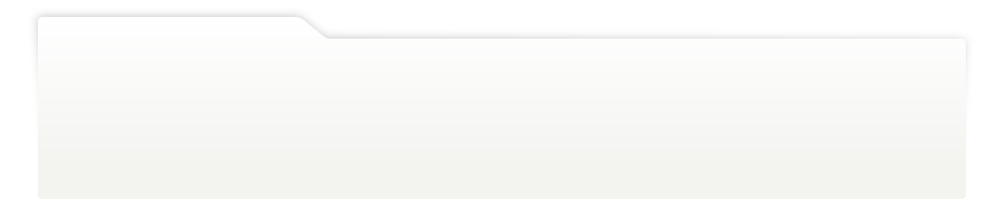
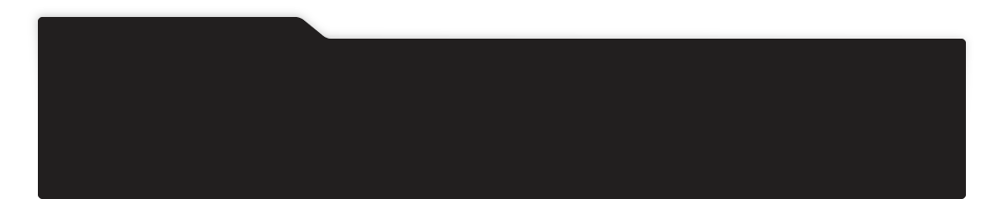
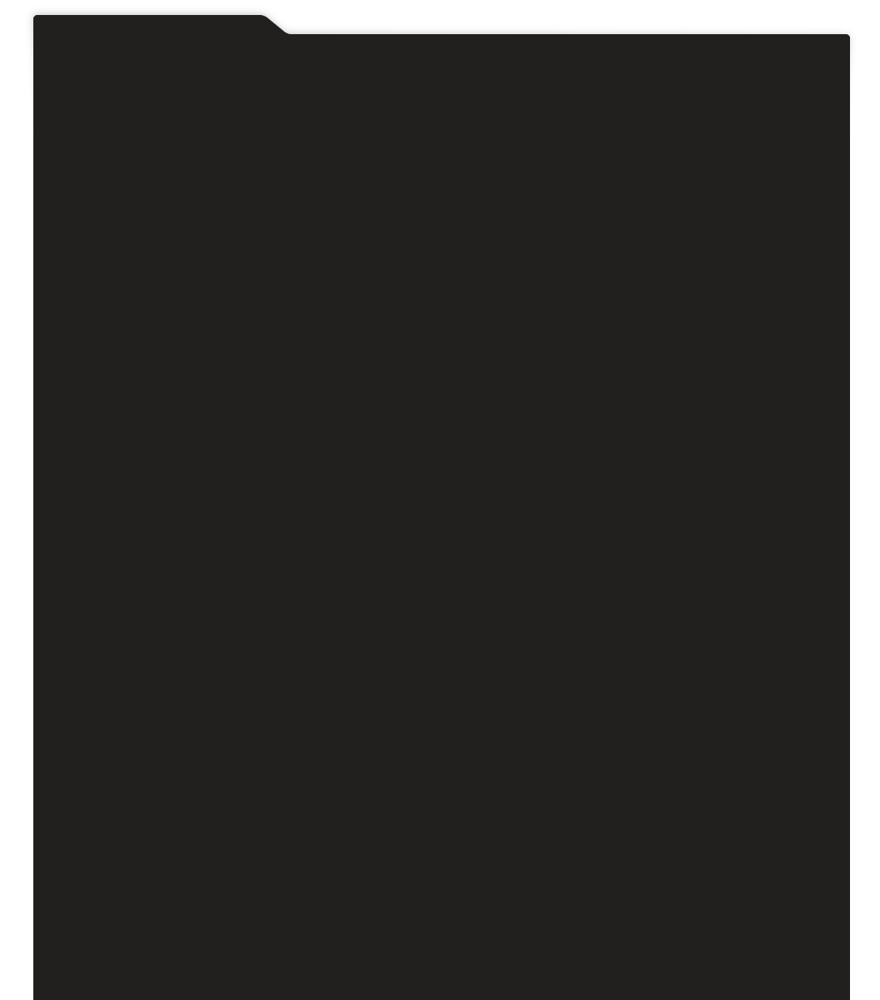
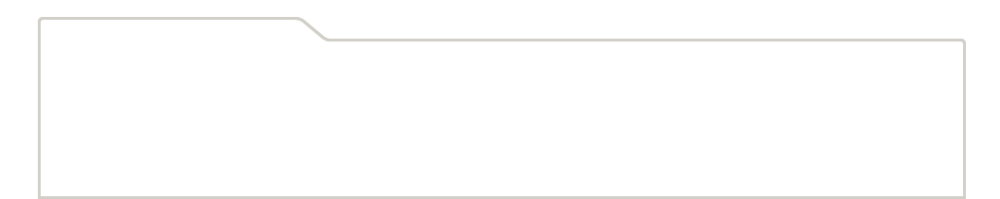
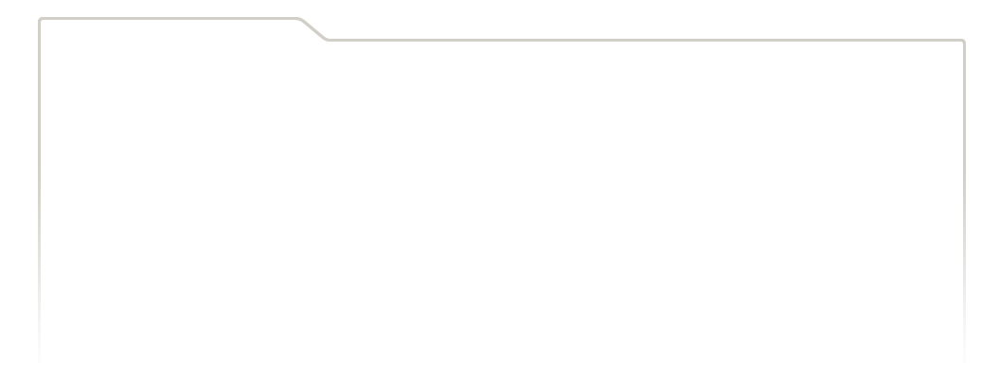
...
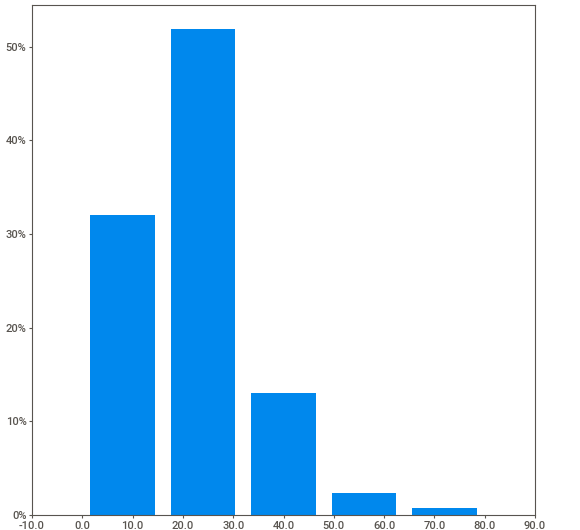
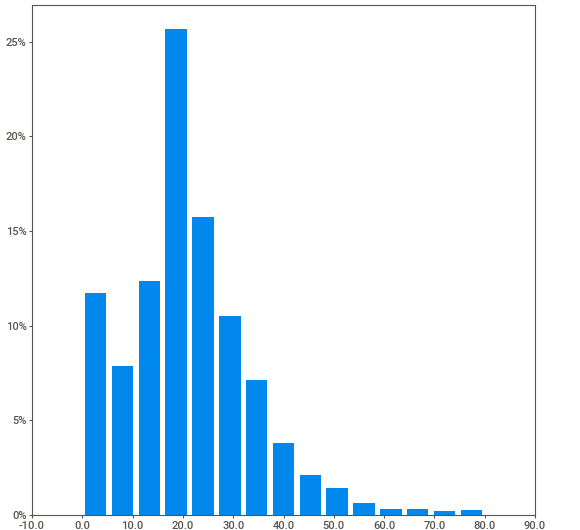
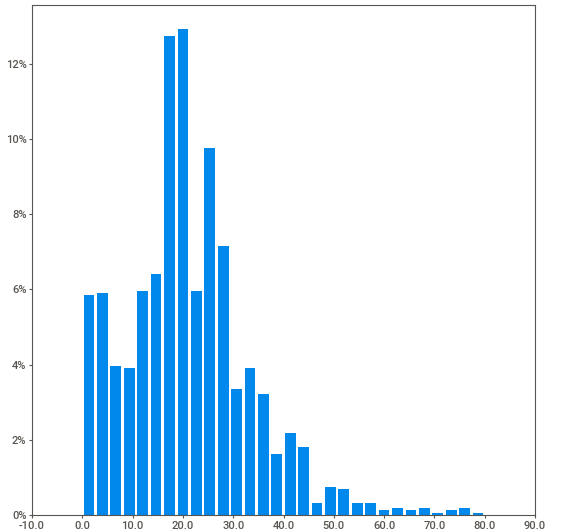
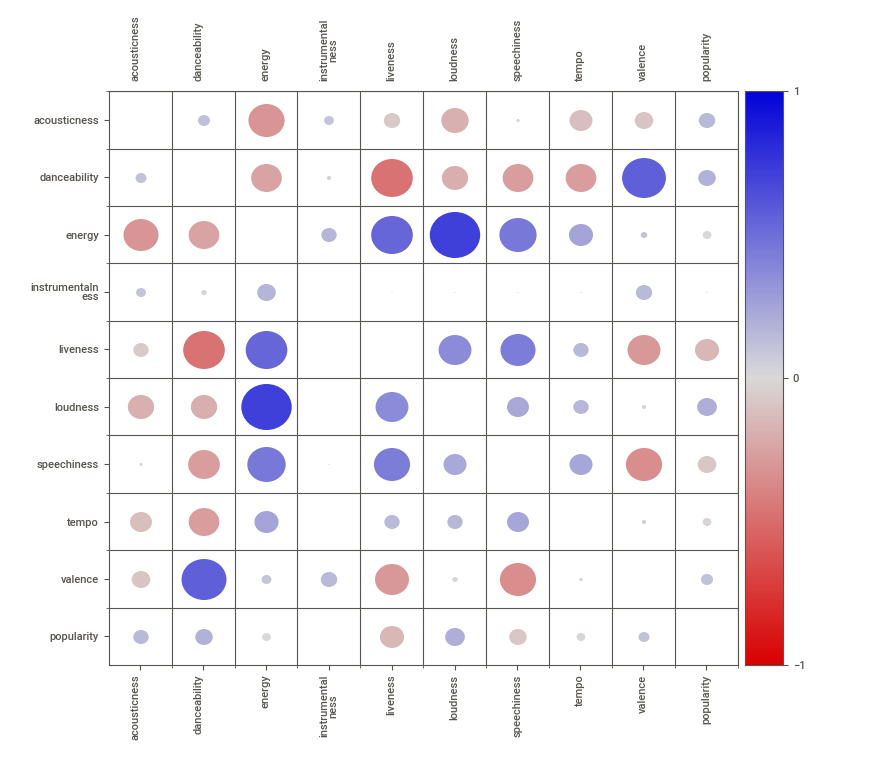
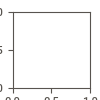

In [ ]:
spotify_report = sw.analyze(new_df)
spotify_report.show_notebook(layout='vertical')

There are 6 duplicate rows which need to be handled




## Visualizing the data

In [ ]:
def plot(feature):
    fig,axes=plt.subplots(1,2)
    sns.boxplot(data=new_df,x=feature,ax=axes[0])
    sns.distplot(a=new_df[feature],ax=axes[1],color='#ff4125')
    fig.set_size_inches(10,3)

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

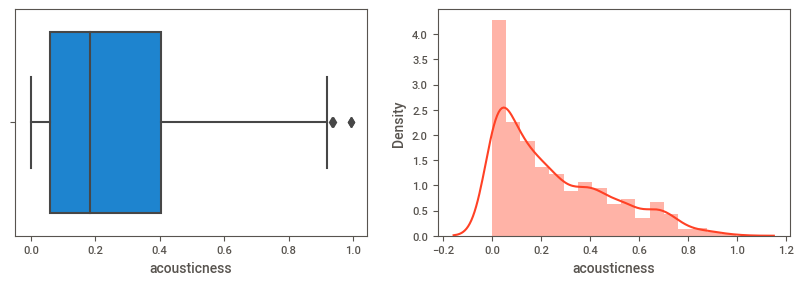

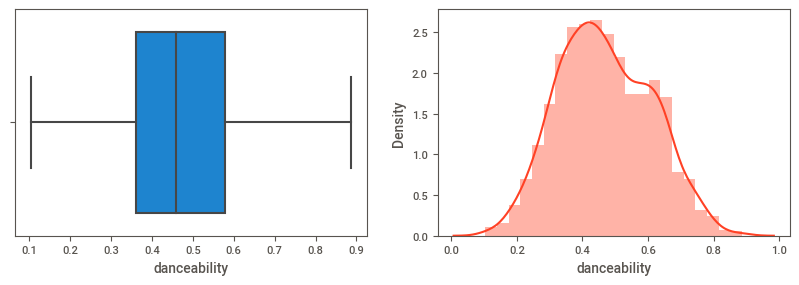

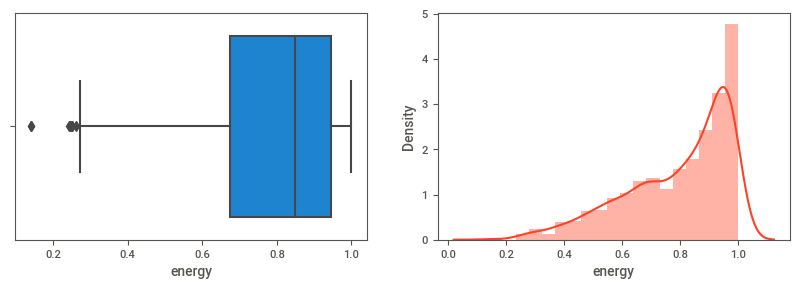

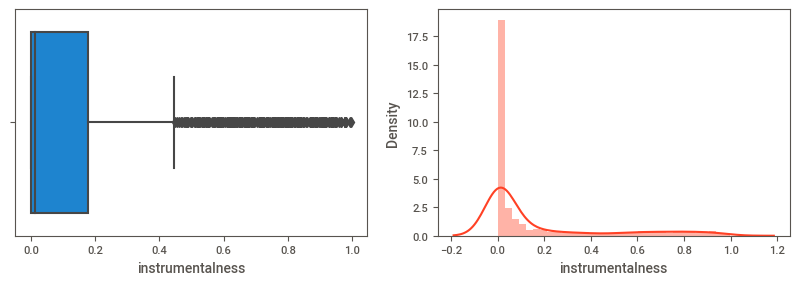

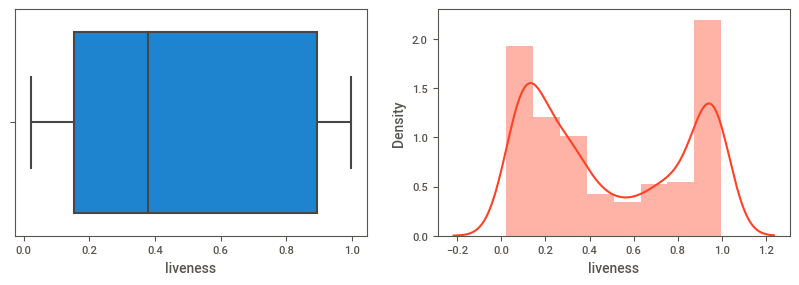

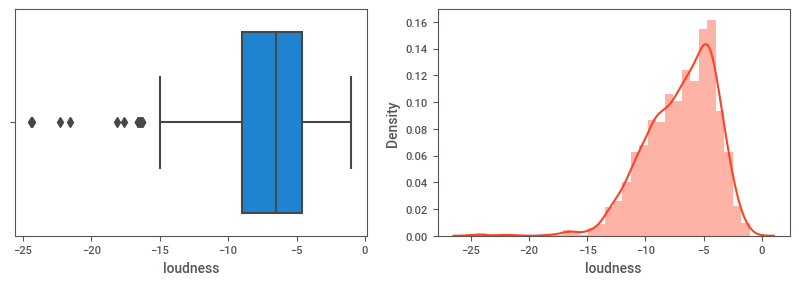

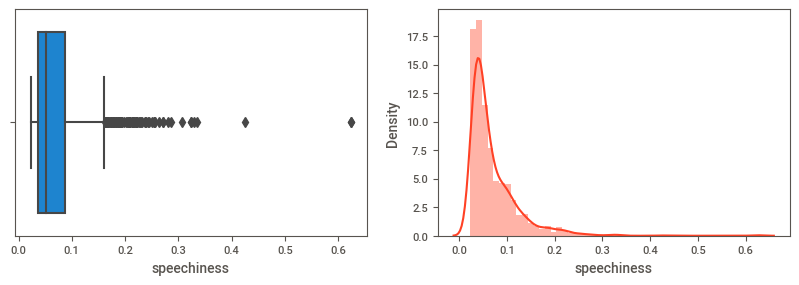

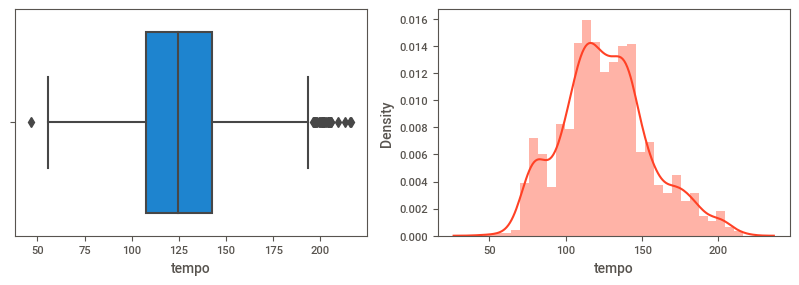

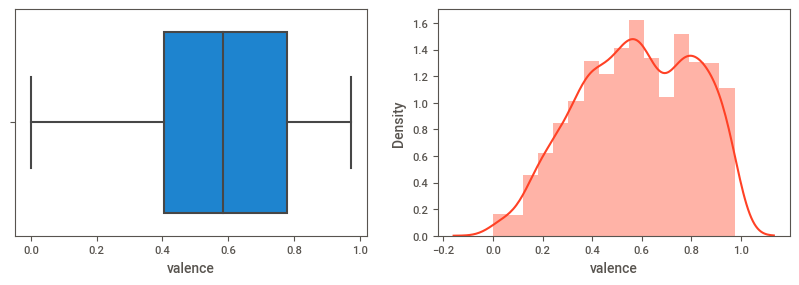

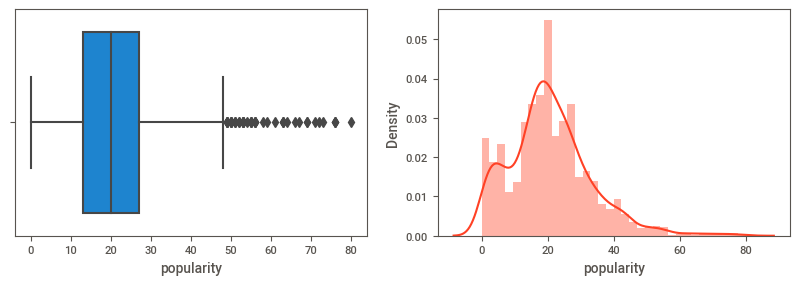

In [ ]:
for feature in ['acousticness','danceability','energy','instrumentalness','liveness','loudness','speechiness','tempo','valence','popularity']:
  plot(feature)

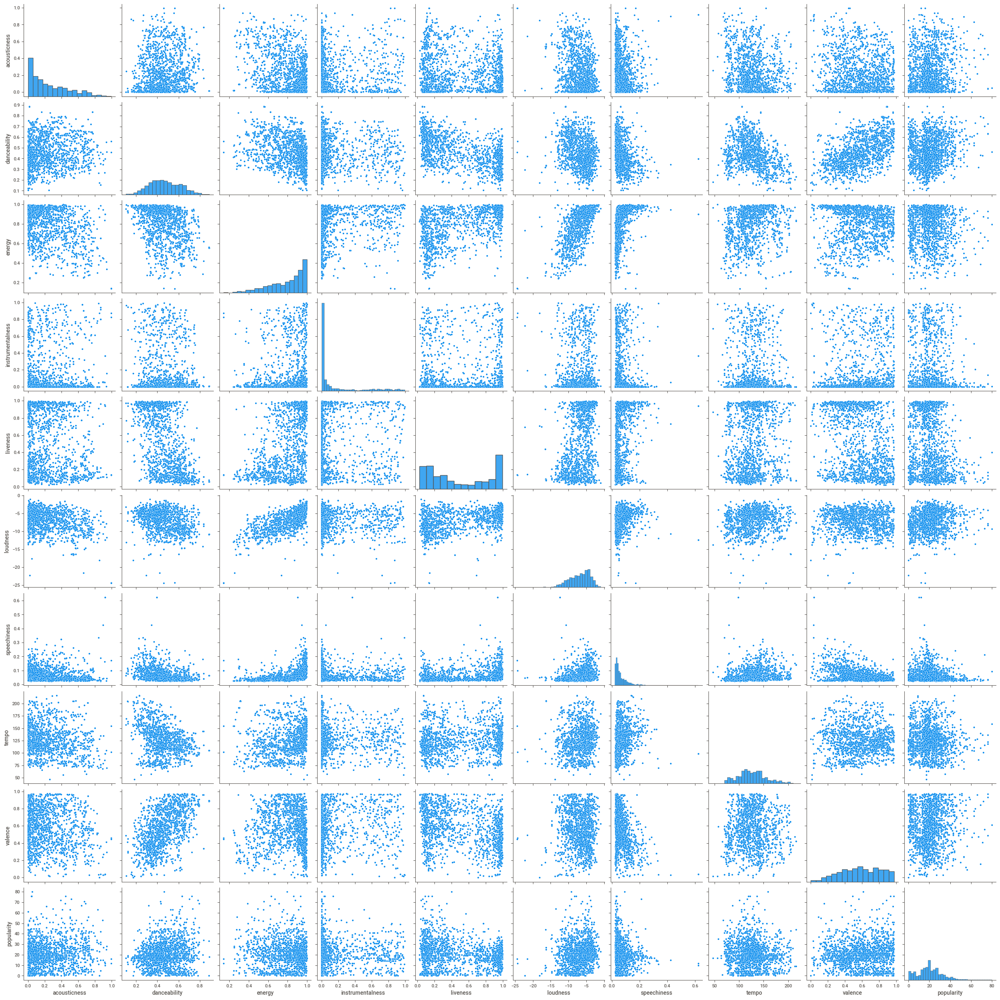

In [ ]:
sns.pairplot(data=new_df , kind='scatter')

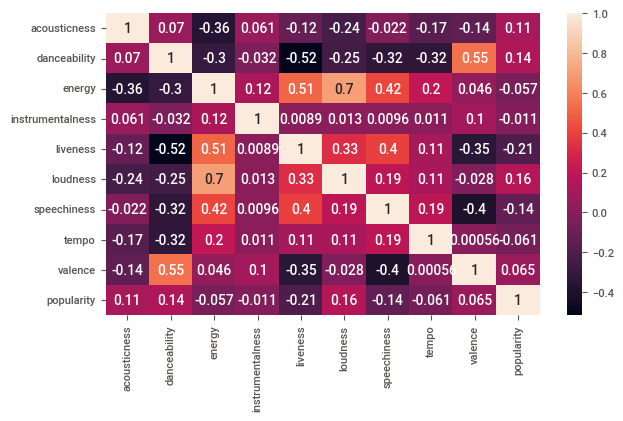

In [ ]:
plt.figure(figsize=(7,4))
sns.heatmap(new_df.corr(),annot=True)

FEATURE ENGINEERING

[Text(0.5, 1.0, 'Correlation between loudnes vs Energy')]

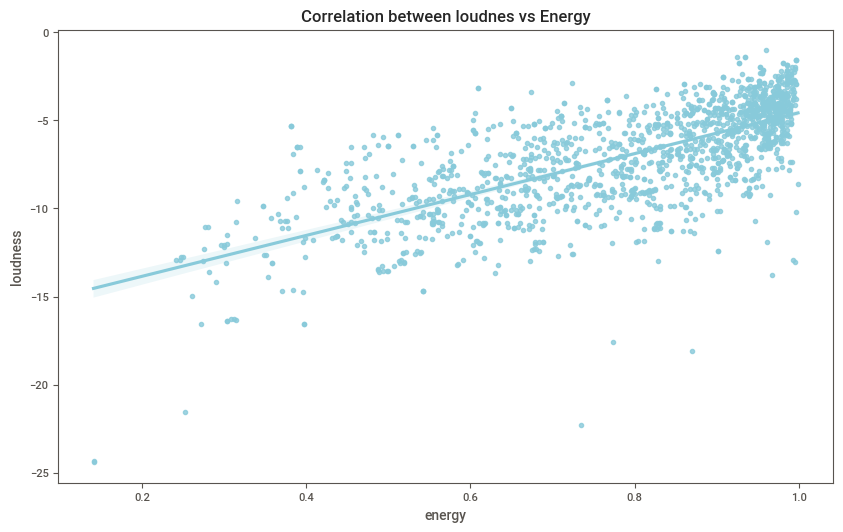

In [ ]:
plt.figure(figsize=(10,6))
sns.regplot(data=new_df,y="loudness",x="energy",color="c").set(title="Correlation between loudnes vs Energy")

TOP FAMOUS SONGS



[Text(0.5, 1.0, 'Top Famous Songs')]

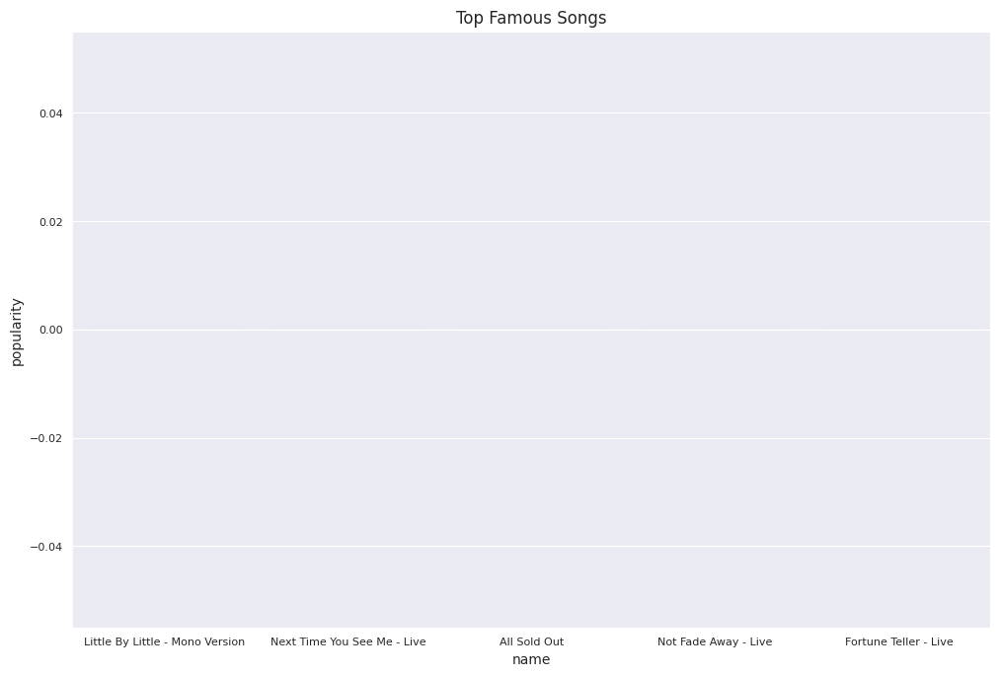

In [ ]:
sns.set_style(style="darkgrid")
plt.figure(figsize=(12,8))
top10_popular_track=df[["popularity","name"]].sort_values(by="popularity",ascending=True).head(5)
sns.barplot(y='popularity',x='name',data=top10_popular_track).set(title="Top Famous Songs")

MOST DANCABLE SONGS

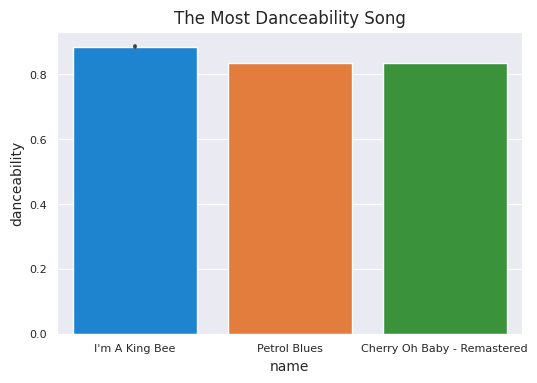

In [ ]:
top_five_danceable_songs = df[["danceability","name"]].sort_values(by="danceability",ascending=False).head(5)

top_five_danceable_songs                                            
sns.barplot(y='danceability',x='name',data=top_five_danceable_songs)
plt.title("The Most Danceability Song")
plt.show()

PREPARING THE DATA

In [ ]:
#removing duplicates
new_df.drop_duplicates()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.0824,0.463,0.993,0.996000,0.9320,-12.913,0.1100,118.001,0.0302,33
1,0.4370,0.326,0.965,0.233000,0.9610,-4.803,0.0759,131.455,0.3180,34
2,0.4160,0.386,0.969,0.400000,0.9560,-4.936,0.1150,130.066,0.3130,34
3,0.5670,0.369,0.985,0.000107,0.8950,-5.535,0.1930,132.994,0.1470,32
4,0.4000,0.303,0.969,0.055900,0.9660,-5.098,0.0930,130.533,0.2060,32
...,...,...,...,...,...,...,...,...,...,...
1605,0.1570,0.466,0.932,0.006170,0.3240,-9.214,0.0429,177.340,0.9670,39
1606,0.0576,0.509,0.706,0.000002,0.5160,-9.427,0.0843,122.015,0.4460,36
1607,0.3710,0.790,0.774,0.000000,0.0669,-7.961,0.0720,97.035,0.8350,30
1608,0.2170,0.700,0.546,0.000070,0.1660,-9.567,0.0622,102.634,0.5320,27


In [ ]:
#Scaling the data
x = new_df.values 
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df = pd.DataFrame(x_scaled)
df.head()

,0,1,2,3,4,5,6,7,8,9
0,0.082889,0.458493,0.993007,1.000000,0.932384,0.491365,0.144474,0.420994,0.031006,0.4125
1,0.439633,0.283525,0.960373,0.233936,0.962094,0.838035,0.087716,0.500239,0.326489,0.4250
2,0.418506,0.360153,0.965035,0.401606,0.956972,0.832350,0.152796,0.492057,0.321355,0.4250
3,0.570419,0.338442,0.983683,0.000107,0.894478,0.806745,0.282623,0.509303,0.150924,0.4000
4,0.402409,0.254151,0.965035,0.056124,0.967216,0.825425,0.116178,0.494808,0.211499,0.4000


CLUSTERING

For each permutation,extract an elbow score and an elbow value. The score tells me how good the clustering was for this permutation, the elbow value tells us the ideal number of clusters for that permutation.

2
0.283742917889354
698.8399895032878
3
0.2869698982582242
539.836333177684
4
0.2552001052599367
483.2790670067455
5
0.2528397369804169
436.7456283045082
6
0.21935594836005476
390.94222348574897
7
0.1661643018296322
359.49951177444166
8
0.16967545138975967
334.2654166004812
9
0.17121617603317266
315.5050878982804
10
0.16679845330488974
299.9819090711383
11
0.16710715623594893
285.3118615011318
12
0.16804669526316207
273.2748642884089
13
0.16655760504344633
256.96712322855393
14
0.16587480206582514
249.79286794305543


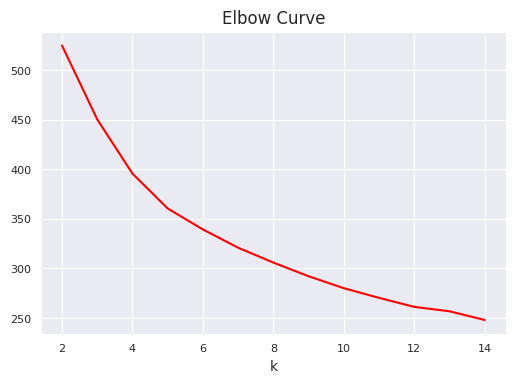

In [ ]:
#plotting elbow curve for best k value
distorsions=[]
for k in range(2,15):
    k_means = KMeans(init="k-means++",n_clusters=k)
    k_means.fit(x_scaled)
    distorsions.append(k_means.inertia_)
    labels_5 = k_means.labels_
    print(k)
    print(metrics.silhouette_score(x_scaled, labels_5, metric = 'euclidean'))
    print(metrics.calinski_harabasz_score(x_scaled, labels_5))
plt.plot(range(2,15), distorsions, color='red')
plt.grid(True)
plt.xlabel('k')
plt.title('Elbow Curve')
plt.show()

k=3 gives best score

In [ ]:
kmeans = KMeans(init="k-means++",n_clusters=3,random_state=15).fit(x_scaled)
df['kmeans'] = kmeans.labels_
df.columns = ['acousticness','danceability','energy','instrumentalness','liveness','loudness','speechiness','tempo','valence','popularity','cluster']
print(metrics.silhouette_score(x_scaled, labels_5, metric = 'euclidean'))
df

0.16587480206582514


,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,cluster
0,0.082889,0.458493,0.993007,1.000000,0.932384,0.491365,0.144474,0.420994,0.031006,0.4125,0
1,0.439633,0.283525,0.960373,0.233936,0.962094,0.838035,0.087716,0.500239,0.326489,0.4250,2
2,0.418506,0.360153,0.965035,0.401606,0.956972,0.832350,0.152796,0.492057,0.321355,0.4250,2
3,0.570419,0.338442,0.983683,0.000107,0.894478,0.806745,0.282623,0.509303,0.150924,0.4000,2
4,0.402409,0.254151,0.965035,0.056124,0.967216,0.825425,0.116178,0.494808,0.211499,0.4000,2
...,...,...,...,...,...,...,...,...,...,...,...
1605,0.157940,0.462324,0.921911,0.006195,0.309497,0.649483,0.032790,0.770502,0.992813,0.4875,1
1606,0.057939,0.517241,0.658508,0.000002,0.506198,0.640378,0.101698,0.444637,0.457906,0.4500,1
1607,0.373234,0.876117,0.737762,0.000000,0.046102,0.703044,0.081225,0.297504,0.857290,0.3750,1
1608,0.218303,0.761175,0.472028,0.000070,0.147628,0.634393,0.064913,0.330483,0.546201,0.3375,1


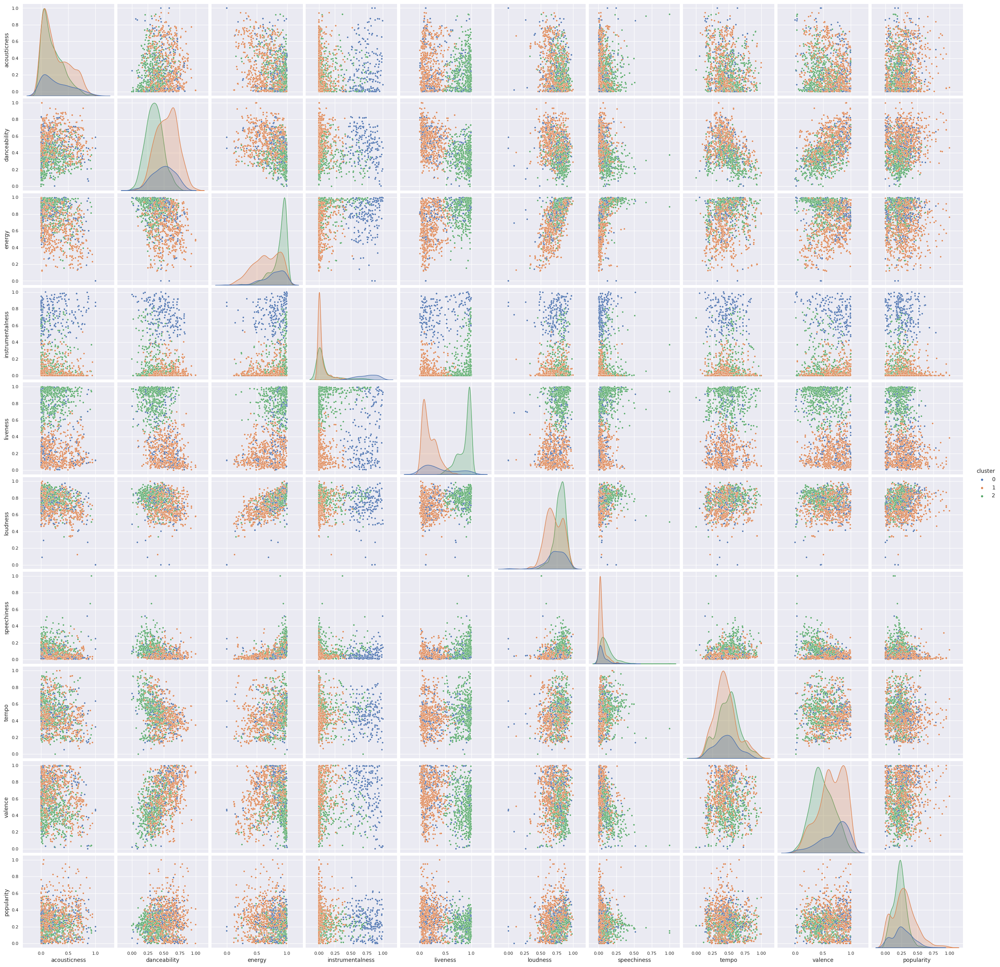

In [ ]:
sns.pairplot(data=df , kind='scatter',hue='cluster',palette="deep")

- instrumentalness helps in giving distinct clusters
- liveness


IMPLEMENTING PCA

- Reducing dimensions to 3

In [ ]:

# Importing standardscalar module 
from sklearn.preprocessing import StandardScaler
  
scalar = StandardScaler()
  
# fitting
scalar.fit(new_df)
scaled_data = scalar.transform(new_df)
  
# Importing PCA
from sklearn.decomposition import PCA
  
# Let's say, components = 2
pca = PCA(n_components = 3)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)
  
x_pca.shape

(1610, 3)

In [ ]:
df3 = pd.DataFrame(x_pca)
df3

,0,1,2
0,-1.315799,1.199516,0.571390
1,-1.826207,0.549152,1.623780
2,-1.947133,0.490725,1.665637
3,-2.530783,1.720482,1.842681
4,-2.151682,1.005081,1.493883
...,...,...,...
1605,0.475806,-1.601800,-0.356608
1606,0.363533,0.335122,0.357853
1607,2.331104,-0.998042,0.752965
1608,2.233119,0.387952,0.183860


In [ ]:
#k=4
kmeans = KMeans(init="k-means++",n_clusters=4,random_state=15).fit(x_pca)
df3 = pd.DataFrame(x_pca)

df3['kmeans'] = kmeans.labels_
labels_5 =df3['kmeans']

print(" silhoutte score for n = 4 ",metrics.silhouette_score(x_pca, labels_5))
df3.columns = ['C1','C2','C3','cluster']

fig = px.scatter_3d(df3, x='C1', y='C2', z='C2',
              color='cluster')
fig.show()

 silhoutte score for n = 4  0.32143542970775096


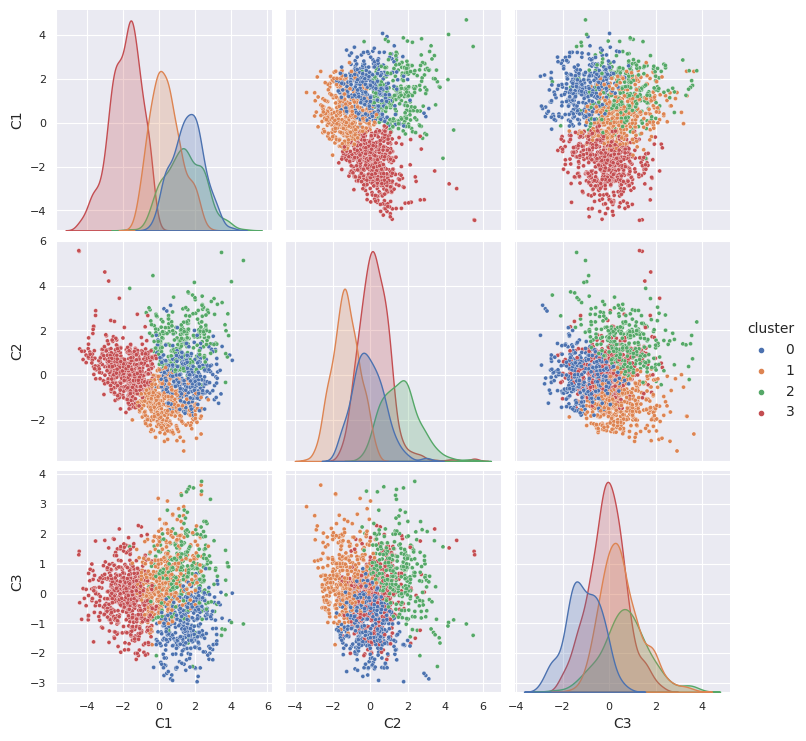

In [ ]:
sns.pairplot(data=df3 , kind='scatter',hue='cluster',palette="deep")

Trying the same approach with 3 features at a time

##Decision Tree as Feature Importance :

using decision tree to find the most important features

Decision tree uses CART technique to find out important features present in it.All the algorithm which is based on Decision tree uses similar technique to find out the important feature.

Feature: 0, Score: 0.0010014022352495227
Feature: 1, Score: 0.02048299621785789
Feature: 2, Score: 0.006361815246843905
Feature: 3, Score: 0.4088726849178225
Feature: 4, Score: 0.5200074908564073
Feature: 5, Score: 0.0035049078233733238
Feature: 6, Score: 0.0003911727481443515
Feature: 7, Score: 0.003990143971885399
Feature: 8, Score: 0.033525403701248645
Feature: 9, Score: 0.0018619822811670786


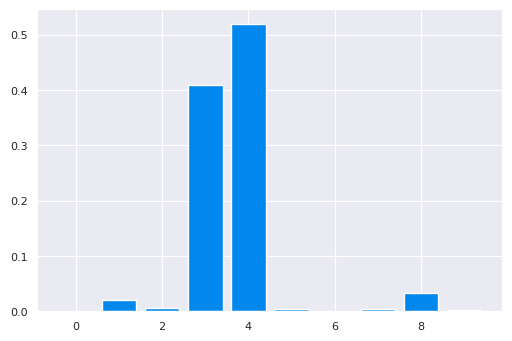

In [ ]:
#decision tree for feature importance on a regression problem
# define the model
model = DecisionTreeRegressor()

y=df['cluster']
# fit the model
model.fit(x_scaled,y)
# get importance
importance = model.feature_importances_
#importance=np.sort(importance)
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: {}, Score: {}'.format(i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

- Feature 4 - liveness
- feature 3 - instrumentalness
- feature 8 - valence

Building a model with these 3 features

2
0.44373456102313874
1320.6122049816138
3
0.4858816133815109
1406.9688822642884
4
0.48991886171591326
1316.8865105301302
5
0.43268881503782436
1400.423124389337
6
0.3867603491291829
1414.1006892095754
7
0.3682228162668564
1340.7709471599903
8
0.36163128500728686
1284.2332620688458
9
0.3547645614295516
1248.3274725977403
10
0.3545209074130668
1240.7980140948334
11
0.36607699066060234
1237.690331841089
12
0.3455783117836219
1216.4840032327947
13
0.34460257217043994
1196.7846325964172
14
0.34891822000893047
1178.6419964301099


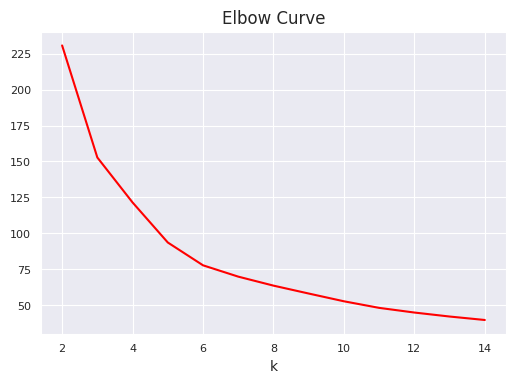

In [ ]:
#Finding optimum cluster size with 3 features
# We will first fit multiple k-means models, and in each successive model, we will increase the number of clusters. 
#We will store the inertia value of each model and then plot it to visualize the result:
# fitting multiple k-means algorithms and storing the values in an empty list
x_in=df[['liveness','instrumentalness','valence']]
min_max_scaler = preprocessing.MinMaxScaler()
x_in_scaled = min_max_scaler.fit_transform(x_in)

#plotting elbow curve for best k value
distorsions=[]
for k in range(2,15):
    k_means = KMeans(init="k-means++",n_clusters=k)
    k_means.fit(x_in_scaled)
    distorsions.append(k_means.inertia_)
    labels_5 = k_means.labels_
    print(k)
    print(metrics.silhouette_score(x_in_scaled, labels_5, metric = 'euclidean'))
    print(metrics.calinski_harabasz_score(x_in_scaled, labels_5))
plt.plot(range(2,15), distorsions, color='red')
plt.grid(True)
plt.xlabel('k')
plt.title('Elbow Curve')
plt.show()

Best cluster size is either 3 or 4

In [ ]:

#k=3
kmeans = KMeans(init="k-means++",n_clusters=3,random_state=15).fit(x_in_scaled)
df2 = pd.DataFrame(x_in_scaled)

df2['kmeans'] = kmeans.labels_
df2.columns = ['liveness','instrumentalness','valence','cluster']
df2

,liveness,instrumentalness,valence,cluster
0,0.932384,1.000000,0.031006,2
1,0.962094,0.233936,0.326489,0
2,0.956972,0.401606,0.321355,0
3,0.894478,0.000107,0.150924,0
4,0.967216,0.056124,0.211499,0
...,...,...,...,...
1605,0.309497,0.006195,0.992813,1
1606,0.506198,0.000002,0.457906,1
1607,0.046102,0.000000,0.857290,1
1608,0.147628,0.000070,0.546201,1


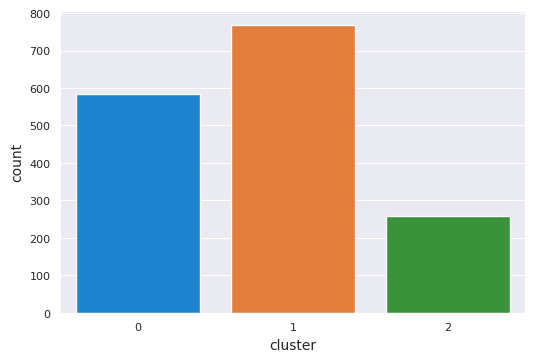

In [ ]:

sns.countplot(x ='cluster', data = df2)
 
# Show the plot
plt.show()

In [ ]:
labels_5 = df2['cluster']

print(metrics.silhouette_score(x_in_scaled, labels_5, metric = 'euclidean'))
print(metrics.calinski_harabasz_score(x_in_scaled, labels_5))
fig = px.scatter_3d(df2, x='liveness', y='instrumentalness', z='valence',
              color='cluster')
fig.show()

0.4858816133815109
1406.9688822642884


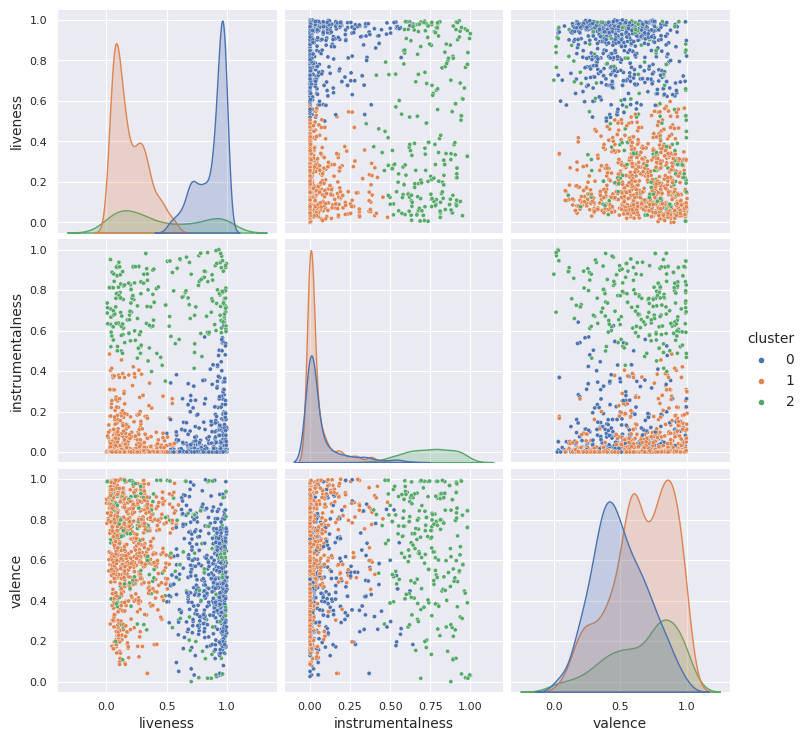

In [ ]:
sns.pairplot(data=df2 , kind='scatter',hue='cluster',palette="deep")

In [ ]:
#k=4
kmeans = KMeans(init="k-means++",n_clusters=4,random_state=15).fit(x_in_scaled)
df3 = pd.DataFrame(x_in_scaled)

df3['kmeans'] = kmeans.labels_
labels_5 =df3['kmeans']

print(" silhoutte score for n = 4 ",metrics.silhouette_score(x_in_scaled, labels_5))
df3.columns = ['liveness','instrumentalness','valence','cluster']

fig = px.scatter_3d(df3, x='liveness', y='instrumentalness', z='valence',
              color='cluster')
fig.show()

 silhoutte score for n = 4  0.48991886171591326


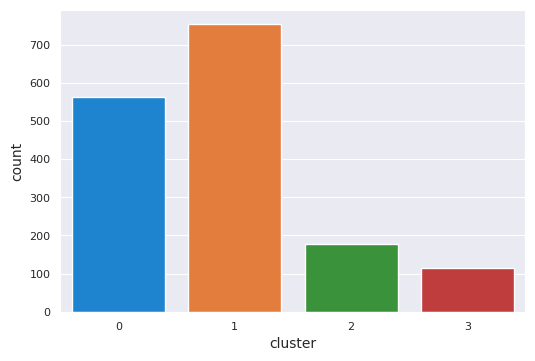

In [ ]:
sns.countplot(x ='cluster', data = df3)
 
# Show the plot
plt.show()

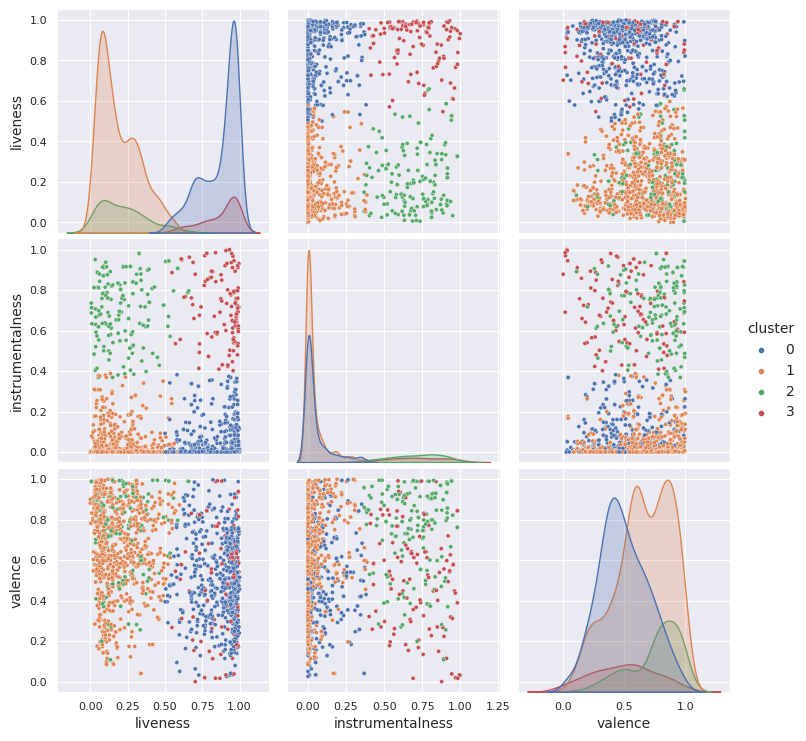

In [ ]:
sns.pairplot(data=df3 , kind='scatter',hue='cluster',palette="deep")

In [ ]:
#Trying the same with BIRCH MODEL

#all features
#3 clusters
model = Birch(branching_factor = 50, threshold = 0.5)
model.fit(x_scaled)
pred = model.predict(x_scaled)
# The silhouette_score gives the 
# average value for all the samples.
silhouette_avg = silhouette_score(x_scaled, pred)
  
print(metrics.silhouette_score(x_scaled, pred, metric = 'euclidean'))
print("calinski score is " ,metrics.calinski_harabasz_score(x_scaled, pred))
pred

0.2683591274183091
calinski score is  498.86563596104224


array([0, 0, 0, ..., 2, 2, 2])

MODEL BUILDING

Building model with the clusters formed using kmeans (k=4)

In [ ]:
df3

,liveness,instrumentalness,valence,cluster
0,0.932384,1.000000,0.031006,3
1,0.962094,0.233936,0.326489,0
2,0.956972,0.401606,0.321355,3
3,0.894478,0.000107,0.150924,0
4,0.967216,0.056124,0.211499,0
...,...,...,...,...
1605,0.309497,0.006195,0.992813,1
1606,0.506198,0.000002,0.457906,0
1607,0.046102,0.000000,0.857290,1
1608,0.147628,0.000070,0.546201,1


In [ ]:
df3.describe()

,liveness,instrumentalness,valence,cluster
count,1610.000000,1610.000000,1610.000000,1610.000000
mean,0.481333,0.164829,0.597706,0.902484
std,0.357647,0.277358,0.237426,0.858435
min,0.000000,0.000000,0.000000,0.000000
25%,0.134310,0.000220,0.415041,0.000000
50%,0.366356,0.013805,0.598563,1.000000
75%,0.893197,0.179719,0.798768,1.000000
max,1.000000,1.000000,1.000000,3.000000


In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1610 entries, 0 to 1609
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   liveness          1610 non-null   float64
 1   instrumentalness  1610 non-null   float64
 2   valence           1610 non-null   float64
 3   cluster           1610 non-null   int32  
dtypes: float64(3), int32(1)
memory usage: 44.1 KB


**Decision Tree**

In [ ]:
X = df3.iloc[:, 0:-1]
Y = df3.iloc[:, -1]

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.20,random_state=42)

In [ ]:
clf_knn=tree.DecisionTreeClassifier()
clf_knn.fit(x_train,y_train)
pred=clf_knn.predict(x_test)

In [ ]:

print(metrics.classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       111
           1       1.00      0.99      1.00       154
           2       1.00      1.00      1.00        33
           3       1.00      1.00      1.00        24

    accuracy                           1.00       322
   macro avg       1.00      1.00      1.00       322
weighted avg       1.00      1.00      1.00       322



**Naive** **Bayes** **Classifier** 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
from sklearn import metrics
print(metrics.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97       276
           1       0.99      0.97      0.98       380
           2       0.91      0.98      0.94        95
           3       0.84      1.00      0.92        54

    accuracy                           0.97       805
   macro avg       0.93      0.98      0.95       805
weighted avg       0.97      0.97      0.97       805

